In [32]:
import matplotlib.pyplot as plt
import numpy as np
import umap
import pandas
import plotly.express as px
import dash

ModuleNotFoundError: No module named 'dash'

In [46]:
i = 3

qho_samples = np.load(f"{i}_QHO_1mil_samples.npy")
com_qho_samples = np.sum(qho_samples,axis = 1)/i
qho_samples = qho_samples - com_qho_samples[:,np.newaxis]

qho_samples_xy = np.ndarray([np.shape(qho_samples)[0],np.shape(qho_samples)[1],2],dtype = 'float32')
qho_samples_xy[:,:,0] = np.real(qho_samples)
qho_samples_xy[:,:,1] = np.imag(qho_samples)
qho_samples_xy = np.reshape(qho_samples_xy,[len(qho_samples),2*i])
qho_labels = np.zeros((qho_samples.shape[0], 1), dtype=int)  # 0s for qho_samples
#for plotting a single sample:
qho_samples_xy_coord = qho_samples_xy.reshape(qho_samples_xy.shape[0], -1, 2)

lll_samples = np.load(f"{i}_LLL_1mil_samples.npy")
com_lll_samples = np.sum(lll_samples,axis = 1)/i
lll_samples = lll_samples - com_lll_samples[:,np.newaxis]

lll_samples_xy = np.ndarray([np.shape(lll_samples)[0],np.shape(lll_samples)[1],2],dtype = 'float32')
lll_samples_xy[:,:,0] = np.real(lll_samples)
lll_samples_xy[:,:,1] = np.imag(lll_samples)
lll_samples_xy = np.reshape(lll_samples_xy,[len(lll_samples),2*i])
lll_labels = np.ones((lll_samples.shape[0], 1), dtype=int)   # 1s for lll_samples

combined_samples_xy = np.concatenate((qho_samples_xy,lll_samples_xy),axis = 0)
combined_labels = np.concatenate([qho_labels, lll_labels], axis=0).reshape(-1)

#subsampling each distribution
subsample_n = 10000
ss_id = np.random.choice(np.arange(qho_samples_xy.shape[0]), size = subsample_n, replace = False)
qho_samples_xy_ss = qho_samples_xy[ss_id,:]
lll_samples_xy_ss = lll_samples_xy[ss_id,:]
combined_samples_xy_ss = np.concatenate((qho_samples_xy_ss,lll_samples_xy_ss),axis = 0)
combined_labels_ss = np.zeros(combined_samples_xy_ss.shape[0])
combined_labels_ss[subsample_n:] = 1
#for plotting a single sample:
combined_samples_xy_coord = combined_samples_xy_ss.reshape(combined_samples_xy_ss.shape[0], -1, 2)

In [45]:
qho_samples_xy[:10000][0]

array([ 1.2065775 , -0.71530205, -1.1236511 , -0.4023947 , -0.0829264 ,
        1.1176968 ], dtype=float32)

(-3.0, 3.0)

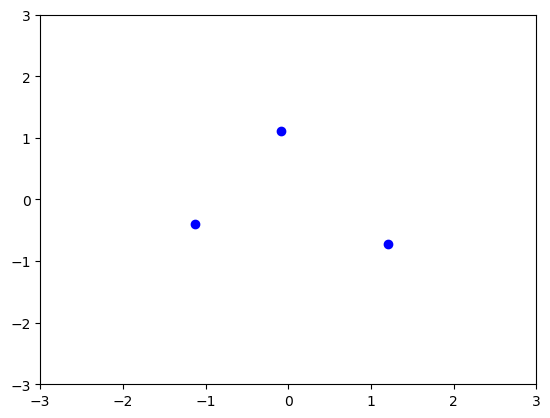

In [47]:
row_id = 0
plt.plot([elt[0] for elt in combined_samples_xy_coord[row_id]], [elt[1] for elt in combined_samples_xy_coord[row_id]], 'bo')
plt.xlim(-3,3)
plt.ylim(-3,3)

In [50]:
mapper = umap.UMAP(n_neighbors=25, n_components=3, metric='euclidean', n_epochs = None, init='spectral')

embedding = mapper.fit_transform(qho_samples_xy[:10000])
#embedding = mapper.fit_transform(combined_samples_xy_ss, y = combined_labels_ss)
#embedding = mapper.fit_transform(qho_samples_xy_ss)


In [54]:
from dash import Dash, dcc, html, Input, Output, no_update, callback
import plotly.express as px
import plotly.graph_objects as go
import numpy as np

# Example data (replace with your actual data)
# embedding = np.random.rand(100, 3)
# combined_labels_ss = np.random.randint(0, 5, 100)
# combined_samples_xy_coord = [np.random.rand(10, 2) for _ in range(100)]

fig = px.scatter_3d(
    x=embedding[:, 0],
    y=embedding[:, 1],
    z=embedding[:, 2]#,
    #color=combined_labels_ss.astype(str)
)

fig.update_layout(
    width=700,
    height=700,
    template='plotly_white'
)

fig.update_traces(
    marker=dict(
        size=2,
        line=dict(
            width=0.5,
            color='DarkSlateGray'
        )
    )
)

#fig.update_traces(hoverinfo="none", hovertemplate=None)

app = Dash(__name__)

app.layout = html.Div([
    dcc.Graph(id="graph-basic-3d", figure=fig, clear_on_unhover=True),
    dcc.Tooltip(id="graph-tooltip"),
])

def plot_row_plotly(row_id):
    """Generate a Plotly plot for a specific row in combined_samples_xy_coord."""
    x_vals = [elt[0] for elt in qho_samples_xy_coord[:10000][row_id]]
    y_vals = [elt[1] for elt in qho_samples_xy_coord[:10000][row_id]]
    
    fig = go.Figure()
    fig.add_trace(go.Scatter(
        x=x_vals, y=y_vals,
        mode='markers',
        marker=dict(color='blue', size=8),
    ))
    
    fig.update_layout(
        xaxis=dict(range=[-3, 3], title='X'),
        yaxis=dict(range=[-3, 3], title='Y'),
        margin=dict(l=0, r=0, t=0, b=0),
        width=200, height=200,
        template='plotly_white',
    )
    
    return fig

@callback(
    Output("graph-tooltip", "show"),
    Output("graph-tooltip", "bbox"),
    Output("graph-tooltip", "children"),
    Input("graph-basic-3d", "hoverData"),
)
def display_hover(hoverData):
    if hoverData is None:
        return False, no_update, no_update

    pt = hoverData["points"][0]
    bbox = pt["bbox"]
    num = pt["pointNumber"]

    # Generate the Plotly plot for the hovered point
    plotly_fig = plot_row_plotly(num)

    children = [
        dcc.Graph(
            figure=plotly_fig,
            config={'displayModeBar': False},
            style={"width": "200px", "height": "200px"},
        )
    ]

    return True, bbox, children

if __name__ == "__main__":
    app.run(debug=True)


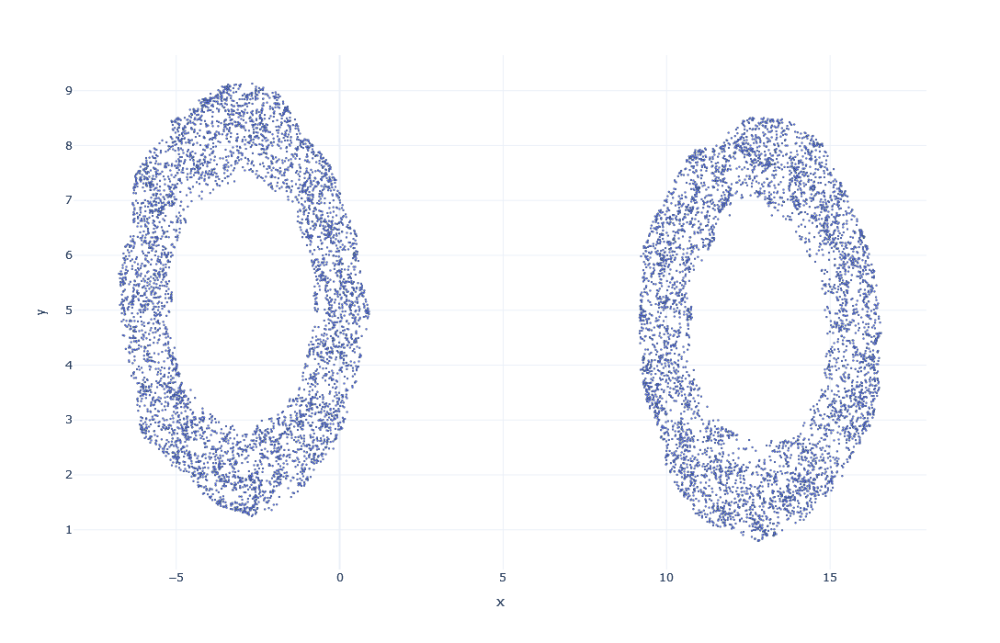

In [116]:
fig = px.scatter(
    x=embedding[:,0],
    y=embedding[:,1]
    #color=combined_labels_ss.astype(str)
)

fig.update_layout(
    width=700,
    height=700,
    template='plotly_white'
)

fig.update_traces(
    marker=dict(
        size=2,
        line=dict(
            width=0.5,
            color='DarkSlateGray'
        )
    )
)

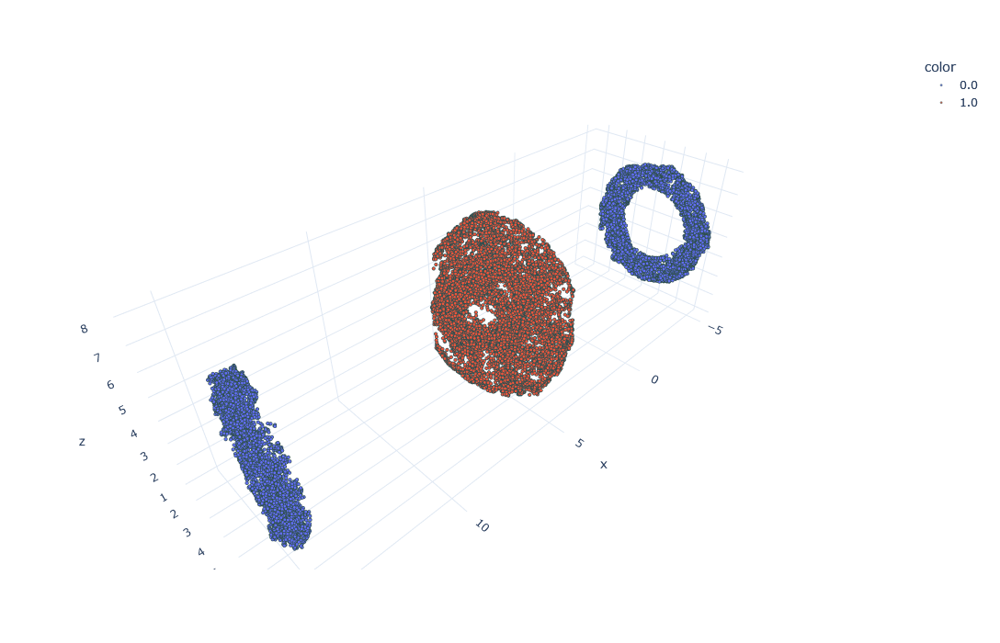

In [4]:
fig = px.scatter_3d(
    x=embedding[:,0],
    y=embedding[:,1],
    z=embedding[:,2],
    color=combined_labels_ss.astype(str)
)

fig.update_layout(
    width=700,
    height=700,
    template='plotly_white'
)

fig.update_traces(
    marker=dict(
        size=2,
        line=dict(
            width=0.5,
            color='DarkSlateGray'
        )
    )
)

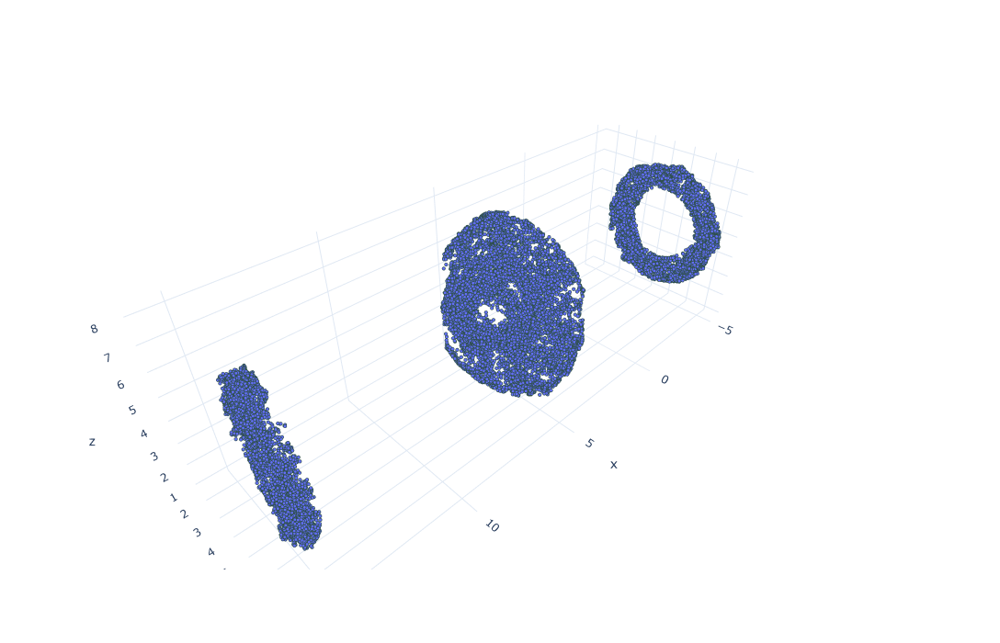

In [5]:
fig = px.scatter_3d(
    x=embedding[:,0],
    y=embedding[:,1],
    z=embedding[:,2]
)

fig.update_layout(
    width=700,
    height=700,
    template='plotly_white'
)

fig.update_traces(
    marker=dict(
        size=2,
        line=dict(
            width=0.5,
            color='DarkSlateGray'
        )
    )
)

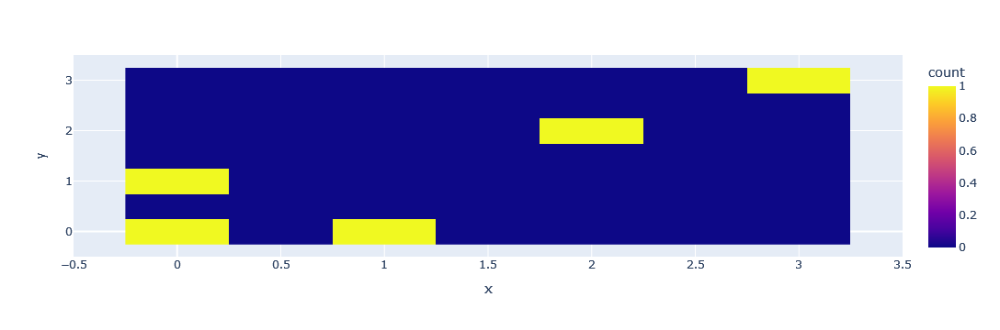

In [118]:
import pandas as pd
# Sample data
data = {'x': [0, 0, 1, 2, 3], 'y': [0, 1, 0, 2, 3]}
df = pd.DataFrame(data)

# Define the number of bins
nbinsx = 10
nbinsy = 10

# Define the range to ensure the origin (0,0) is within a bin
range_x = [-0.5, 3.5]
range_y = [-0.5, 3.5]

# Create the density heatmap
fig = px.density_heatmap(df, x='x', y='y', nbinsx=nbinsx, nbinsy=nbinsy, range_x=range_x, range_y=range_y)

fig.show()